In [2]:
from tqdm import tqdm
import numpy as np
import pickle
import sys
import object3d_kitti

import os
import shutil

## Convert Annos to Labels

In [3]:
def get_label_from_annos(det_annos):
    label = []
    for idx in range(len(det_annos['name'])):
        name  = det_annos['name'][idx]
        truncated = det_annos['truncated'][idx]
        occluded = det_annos['occluded'][idx]
        alpha = det_annos['alpha'][idx]
        box_2d = ' '.join([f'{x:.2f}' for x in det_annos['bbox'][idx]])
        dim = ' '.join([f'{x:.2f}' for x in det_annos['dimensions'][idx][1:]])      # NOTE should be h w l
        l = det_annos['dimensions'][idx][0]
        dim += ' ' + f'{l:.2f}'
        loc = ' '.join([f'{x:.2f}' for x in det_annos['location'][idx]])
        a = det_annos['rotation_y'][idx]
        label.append(f'{name} {truncated:.2f} {occluded} {alpha:.2f} {box_2d} {dim} {loc} {a:.2f}')
    return label

In [3]:
output_folder = "/home/hpaat/my_exp/MTrans-evidential/small_experiments/experiment_100.06"
exp_name = "mtrans_v3_pseudolabels"
# pcdet_folder = "/home/hpaat/my_exp/GLENet/output/cfgs/kitti_models/pointrcnn/vanilla_mtrans_v3/eval/eval_with_train/epoch_80/val"
pcdet_folder = "/home/hpaat/my_exp/GLENet_v3/output/cfgs/kitti_models/GLENet_pointrcnn/v19.03500.8.v11_fixed_unc_wrong/eval/eval_with_train/epoch_80/val"

save_pl_path =   os.path.join(output_folder, exp_name, "pseudolabels")
annos_file = "result.pkl"
annos_path =    os.path.join(pcdet_folder, annos_file)             #"/home/hpaat/pcdet/output/kitti_models/pointrcnn/vanilla_fgr_666_pcdetaug/val_det_annos.pkl"
val_ids_path =   "/home/hpaat/pcdet/data/kitti/ImageSets/val.txt"

with open(train_ids_path) as f:
    train_ids = f.readlines()
    val_ids = [x.strip() for x in val_ids]

with open(annos_path, "rb") as input_file:
    val_det_annos = pickle.load(input_file)

if not os.path.exists(save_pl_path):
    os.makedirs(save_pl_path)
else:
    shutil.rmtree(save_pl_path)
    os.makedirs(save_pl_path)

for det_annos in tqdm(val_det_annos[:50], position=0, leave=True):
    # if det_annos['frame_id']=='000327':
    #     import pdb; pdb.set_trace()

    label_text_lst = get_label_from_annos(det_annos)

    # When there is no detection
    if len(label_text_lst) == 0:
        with open(os.path.join(save_pl_path, det_annos['frame_id'] + '.txt'), 'a') as file:
            file.write('')

    for label_txt in label_text_lst:
        with open(os.path.join(save_pl_path, det_annos['frame_id'] + '.txt'), 'a') as file:
            file.write(label_txt)
            file.write('\n')
    

100%|██████████| 50/50 [00:00<00:00, 643.09it/s]


## Visualize 3D Box in Image

In [1]:
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt

from PIL import Image
# from skimage import io
from matplotlib.lines import Line2D

000003


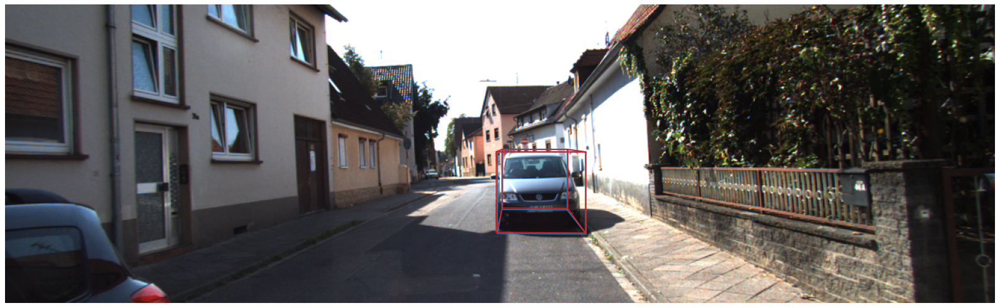

000007


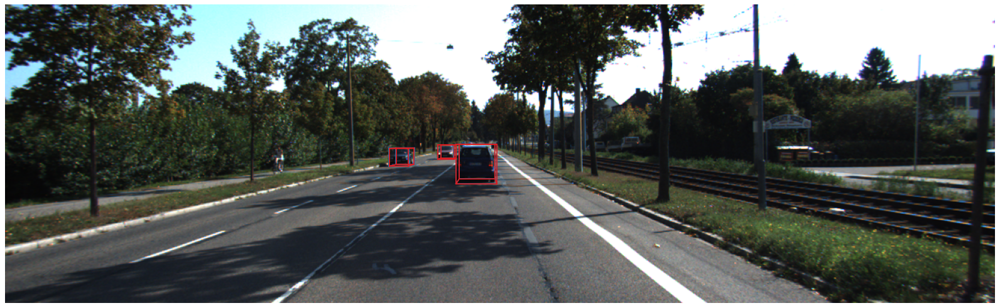

000009


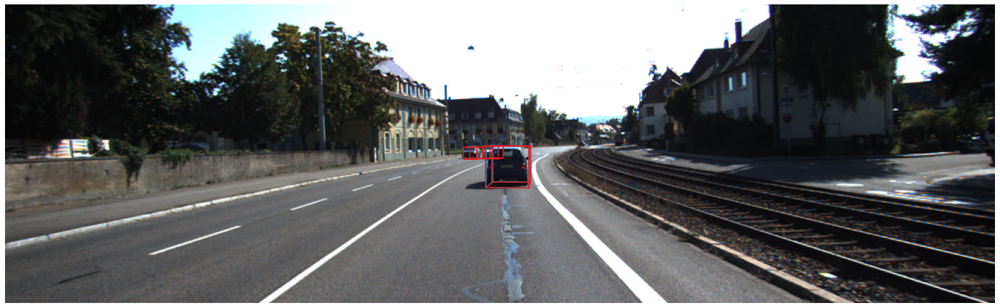

000010


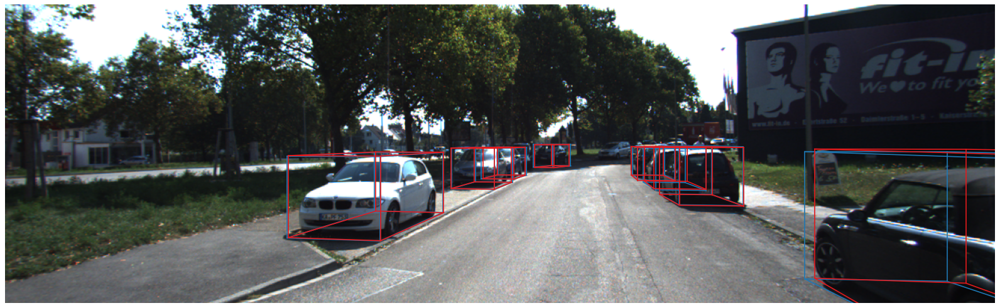

000011


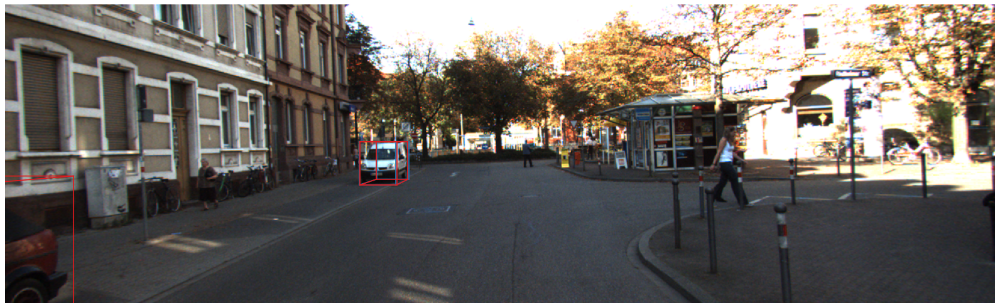

000012


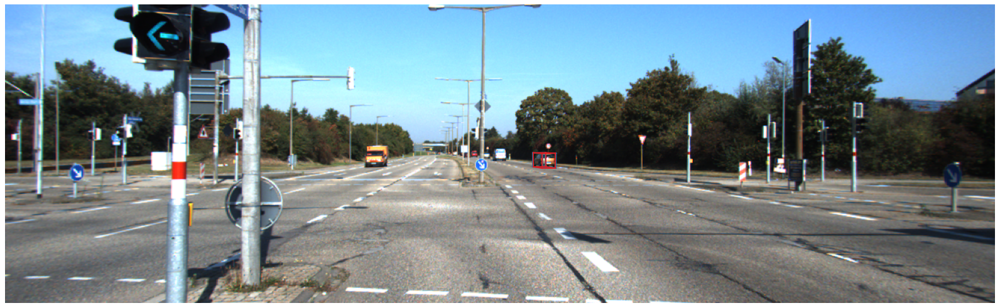

000013


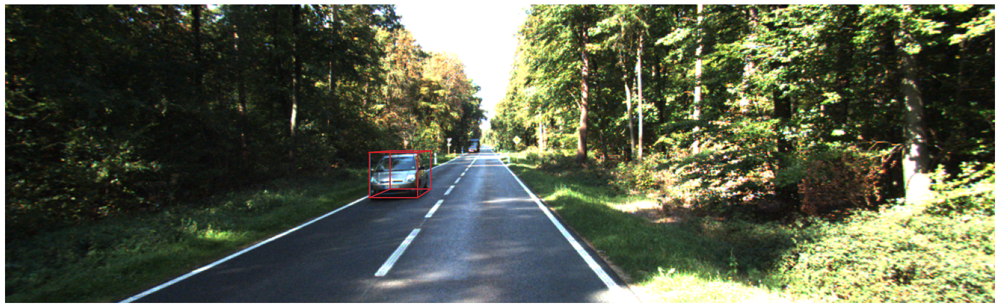

000014


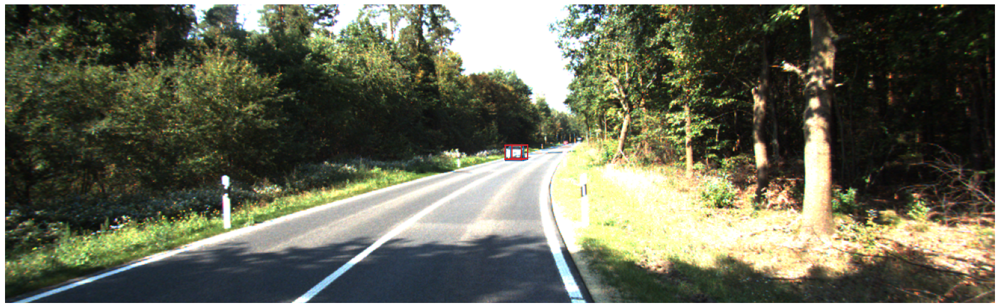

000016


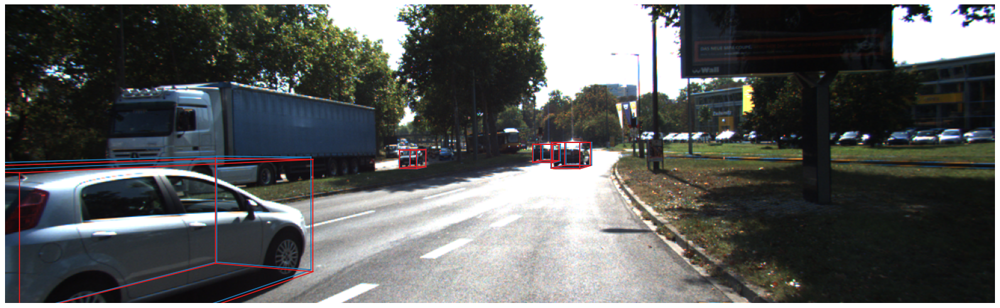

000017


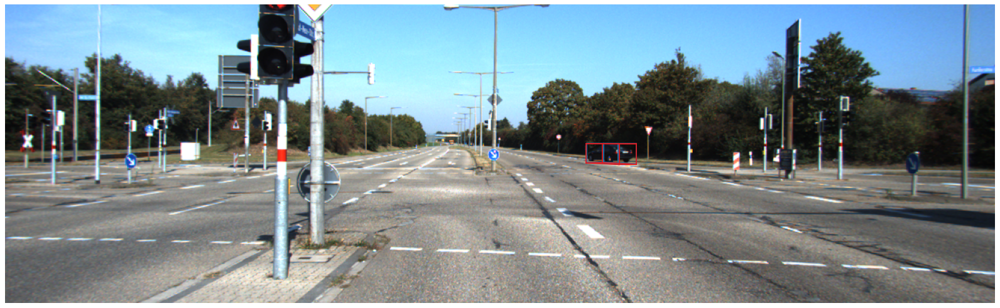

In [7]:
def box3d_to_img(label_path, tag, file_id, front=1, path2=None):
  colors = sns.color_palette('Paired', 9 * 2)
  names = ['Car'] #, 'Van', 'Truck', 'Pedestrian', 'Person_sitting', 'Cyclist', 'Tram', 'Misc', 'DontCare']
  im_path = '/home/hpaat/pcdet/data/kitti/training/image_2/'
  calib_path = '/home/hpaat/pcdet/data/kitti/training/calib/'
  index = '0'

  # load image
  img = np.array(Image.open(im_path + file_id + '.png'), dtype=np.int32)

  # load labels
  with open(label_path + file_id + '.txt', 'r') as f:
    labels = f.readlines()
  if path2 is not None:
    with open(path2 + file_id + '.txt', 'r') as f:
      labels_2 = f.readlines()
  
  len_labels_1 = len(labels)
  labels = labels + labels_2

  # load calibration file
  with open(calib_path + file_id + '.txt', 'r') as f:
    lines = f.readlines()
    P2 = np.array(lines[2].strip().split(' ')[1:], dtype=np.float32).reshape(3, 4)

  fig = plt.figure(figsize=(20, 15), dpi=80)    # change the display/show size
  # draw image
  plt.imshow(img)

  for line_idx, line in enumerate(labels):
    if line_idx >= len_labels_1:
      front = 5
    else:
      front = 1
    line = line.split()
    try:
      lab, _, _, _, _, _, _, _, h, w, l, x, y, z, rot = line
    except:
      lab, _, _, _, _, _, _, _, h, w, l, x, y, z, rot, _ = line
    h, w, l, x, y, z, rot = map(float, [h, w, l, x, y, z, rot])
    if lab != 'DontCare' and lab in names:
      x_corners = [l / 2, l / 2, -l / 2, -l / 2, l / 2, l / 2, -l / 2, -l / 2]
      y_corners = [0, 0, 0, 0, -h, -h, -h, -h]
      z_corners = [w / 2, -w / 2, -w / 2, w / 2, w / 2, -w / 2, -w / 2, w / 2]
      corners_3d = np.vstack([x_corners, y_corners, z_corners])  # (3, 8)

      # transform the 3d bbox from object coordiante to camera_0 coordinate
      R = np.array([[np.cos(rot), 0, np.sin(rot)],
                    [0, 1, 0],
                    [-np.sin(rot), 0, np.cos(rot)]])
      corners_3d = np.dot(R, corners_3d).T + np.array([x, y, z])

      # transform the 3d bbox from camera_0 coordinate to camera_x image
      corners_3d_hom = np.concatenate((corners_3d, np.ones((8, 1))), axis=1)
      corners_img = np.matmul(corners_3d_hom, P2.T)
      corners_img = corners_img[:, :2] / corners_img[:, 2][:, None]


      def line(p1, p2, front=1):
        # VARY THE COLOR CODE
        # if line_idx==5 or line_idx==6 or line_idx==3:       # 000006: 3,5,6
        #   front = 5
        #   plt.gca().add_line(Line2D((p1[0], p2[0]), (p1[1], p2[1]), color=colors[names.index(lab) * 2 + front]))
        # elif line_idx>=7:
        #   front = 10
        #   plt.gca().add_line(Line2D((p1[0], p2[0]), (p1[1], p2[1]), color=colors[names.index(lab) * 2 + front]))
        # else:
        #   plt.gca().add_line(Line2D((p1[0], p2[0]), (p1[1], p2[1]), color=colors[names.index(lab) * 2 + front]))
        plt.gca().add_line(Line2D((p1[0], p2[0]), (p1[1], p2[1]), color=colors[names.index(lab) * 2 + front]))

      # draw the upper 4 horizontal lines
      line(corners_img[0], corners_img[1], front=front)  # front = 0 for the front lines
      line(corners_img[1], corners_img[2], front=front)
      line(corners_img[2], corners_img[3], front=front)
      line(corners_img[3], corners_img[0], front=front)

      # draw the lower 4 horizontal lines
      line(corners_img[4], corners_img[5], front=front)
      line(corners_img[5], corners_img[6], front=front)
      line(corners_img[6], corners_img[7], front=front)
      line(corners_img[7], corners_img[4], front=front)

      # draw the 4 vertical lines
      line(corners_img[4], corners_img[0], front=front)
      line(corners_img[5], corners_img[1], front=front)
      line(corners_img[6], corners_img[2], front=front)
      line(corners_img[7], corners_img[3], front=front)

  # fig.patch.set_visible(False)
  
  plt.axis('off')
  plt.tight_layout()
  #plt.savefig('/home/hpaat/my_exp/MTrans-evidential/small_experiments/experiment_100.06/gt_mtrans_v3/' + file_id + '_' + tag + '.png', bbox_inches='tight')
  plt.show()

# if __name__ == '__main__':
#   # Get the train ids
#   val_ids_path = "/home/hpaat/pcdet/data/kitti/ImageSets/val.txt"
#   with open(val_ids_path) as f:
#       val_ids = f.readlines()
#       val_ids = [x.strip() for x in val_ids]

#   save_cnt = 0
#   # Set index to choose which train ids to start looking                                      
#   index = 0

#   # Only save 10 images
#   while save_cnt < 1:     #10
#     seq = "000006"        #val_ids[index]
#     label_path = '/home/hpaat/my_exp/MTrans-evidential/small_experiments/experiment_100.06/MEDLU/final_pseudolabels/'  
#     with open(label_path + seq + '.txt') as g:
#       seq_lbl = g.readlines()
#     if len(seq_lbl) != 0:
#       print(seq)
#       tag = 'van_mtrans_v3' 
#       file_id = seq
#       box3d_to_img(label_path, tag, file_id)
#     #   label_path = '/home/hpaat/FGR/output/pseudo_labels_orig/labels/'
#     #   tag = 'fgr'
#     #   box3d_to_img(label_path, tag, file_id)
#       save_cnt += 1
#     index += 1


if __name__ == '__main__':
  # VISUALIZE MTrans PSEUDOLABELS
  # Get the train ids
  train_ids_path = "/home/hpaat/pcdet/data/kitti/ImageSets/train.txt"
  with open(train_ids_path) as f:
      train_ids = f.readlines()
      train_ids = [x.strip() for x in train_ids]

  save_cnt = 0
  # Set index to choose which train ids to start looking                                      
  index = 0

  # Only save _ images
  while save_cnt < 10:     #10
    seq = train_ids[index]
    label_path = '/home/hpaat/my_exp/MTrans-evidential/small_experiments/experiment_100.06/mtrans_v3_pseudolabels/' #'/home/hpaat/my_exp/MTrans-evidential/small_experiments/experiment_100.06/MEDLU/final_pseudolabels/'  
    with open(label_path + seq + '.txt') as g:
      seq_lbl = g.readlines()
    if len(seq_lbl) != 0:
      print(seq)
      tag = 'van_mtrans_v3' 
      file_id = seq
      # box3d_to_img(label_path, tag, file_id)
      gt_label_path = '/home/hpaat/KITTI/data_object_label_2/training/label_2/'
      tag = 'fgr'
      box3d_to_img(label_path, tag, file_id, front=5, path2 = gt_label_path)
      save_cnt += 1
    index += 1